In [1]:
2+2

4

In [2]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchinfo import summary
import torch
import torch.nn as nn
from tqdm import tqdm


transform = transforms.ToTensor()

train_dataset = datasets.FashionMNIST(
    root="data",
    train=True,
    download=True,
    transform=transform
)   

test_dataset = datasets.FashionMNIST(
    root="data",
    train=False,
    download=True,
    transform=transform
)

train_loader = DataLoader(train_dataset,
                          batch_size=64,
                          shuffle=True)

test_loader = DataLoader(test_dataset,
                         batch_size=64,
                         shuffle=False)

In [3]:
# shapes of the data
for images, labels in train_loader:
    print(f"Images batch shape: {images.size()}")
    print(f"Labels batch shape: {labels.size()}")
    break

# total number of samples in the training and test datasets
print(f"Total training samples: {len(train_dataset)}")
print(f"Total test samples: {len(test_dataset)}")

Images batch shape: torch.Size([64, 1, 28, 28])
Labels batch shape: torch.Size([64])
Total training samples: 60000
Total test samples: 10000


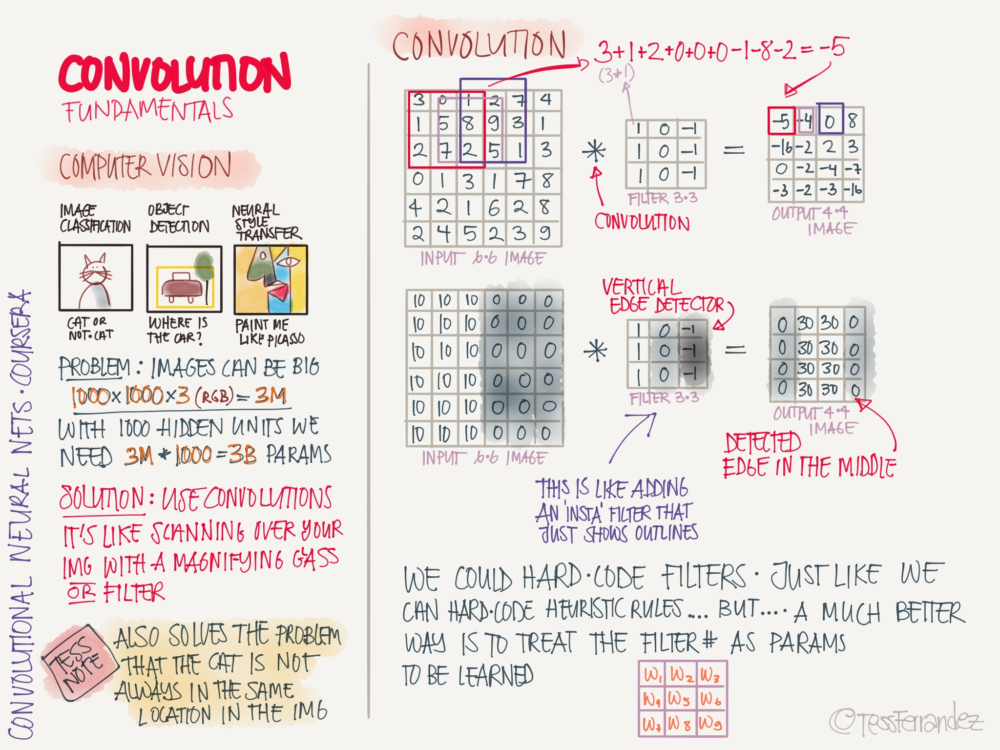

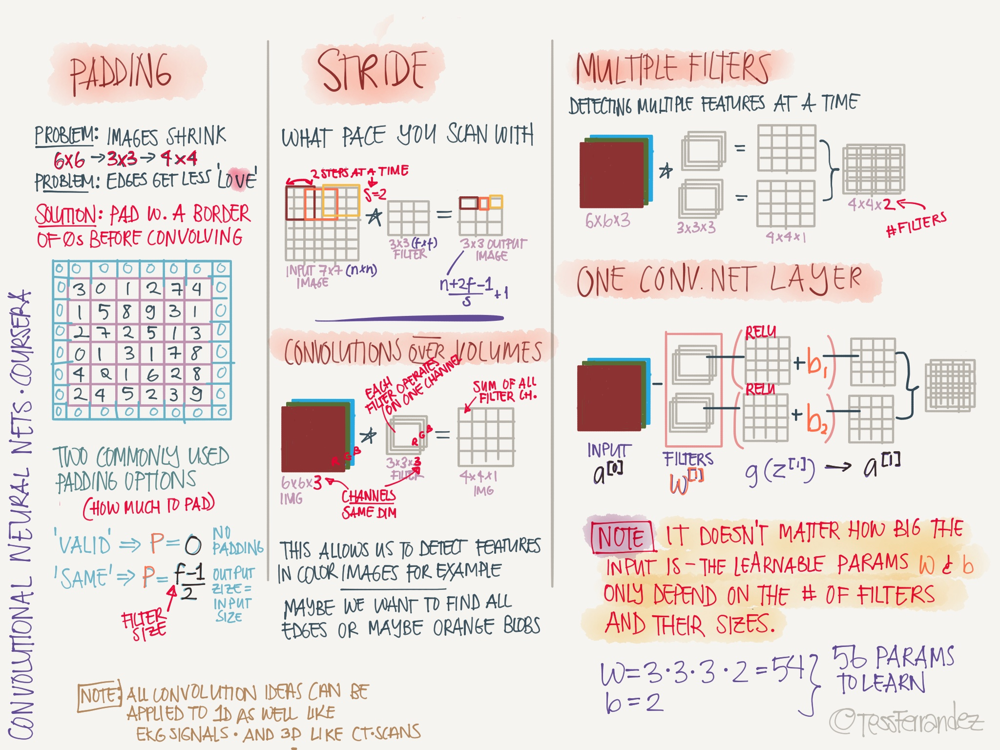

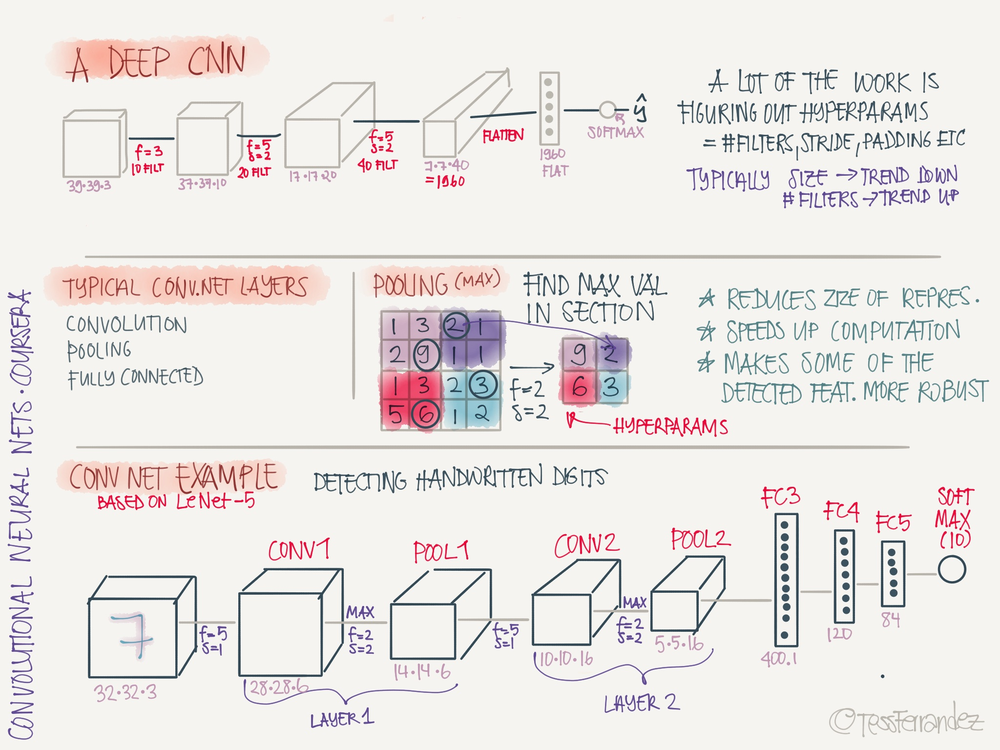

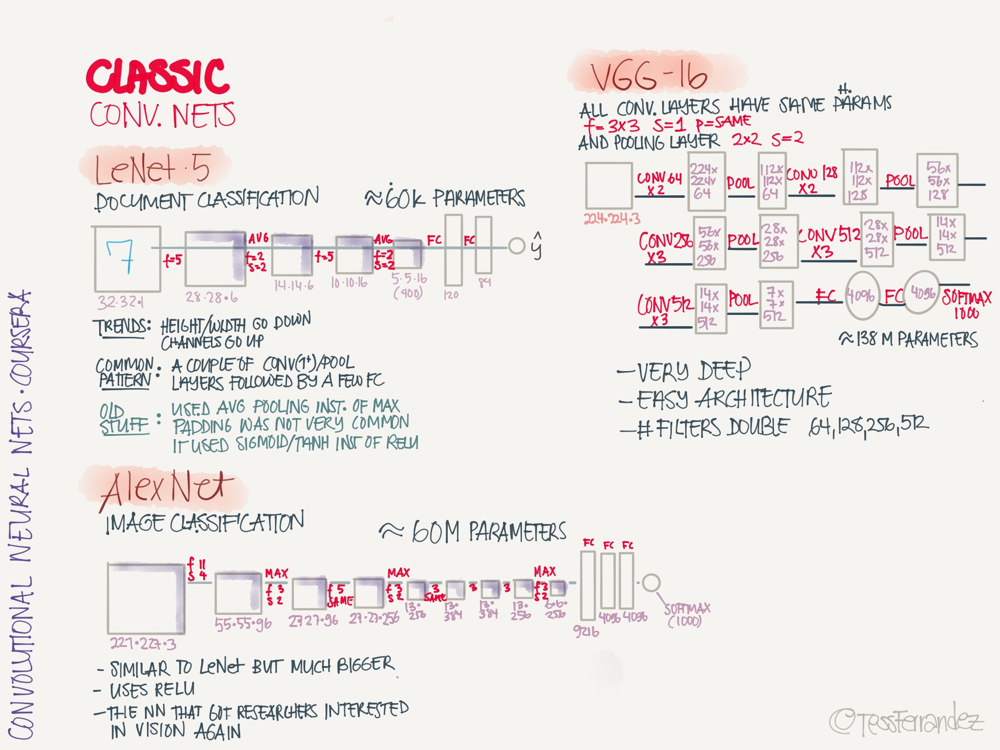

In [ ]:


# class FashionMLP(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.flatten = nn.Flatten()
#         self.fc1 = nn.Linear(28 * 28, 256)
#         self.fc2 = nn.Linear(256, 128)
#         self.fc3 = nn.Linear(128, 10)
#         self.relu = nn.ReLU()


#     def forward(self, x):
#         x = self.flatten(x)
#         x = self.fc1(x)
#         x= self.relu(x)
#         x = self.fc2(x)
#         x = self.relu(x)
#         x = self.fc3(x)
#         return x

class FashionCNN(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(
            in_channels=1,
            out_channels=16,
            kernel_size=3,
            padding=1
        )

        self.pool = nn.MaxPool2d(kernel_size=2)

        self.conv2 = nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=3,
            padding=1
        )

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(32 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, 10)

        self.relu = nn.ReLU()

    def forward(self, x):

        x = self.conv1(x)
        x = self.relu(x)
        x = self.pool(x)

        x = self.conv2(x)
        x = self.relu(x)
        x = self.pool(x)

        x = self.flatten(x)

        x = self.fc1(x)
        x = self.relu(x)

        x = self.fc2(x)

        return x

In [5]:
summary(FashionCNN(), input_size=(64, 1, 28, 28))

Layer (type:depth-idx)                   Output Shape              Param #
FashionCNN                               [64, 10]                  --
├─Conv2d: 1-1                            [64, 16, 28, 28]          160
├─ReLU: 1-2                              [64, 16, 28, 28]          --
├─MaxPool2d: 1-3                         [64, 16, 14, 14]          --
├─Conv2d: 1-4                            [64, 32, 14, 14]          4,640
├─ReLU: 1-5                              [64, 32, 14, 14]          --
├─MaxPool2d: 1-6                         [64, 32, 7, 7]            --
├─Flatten: 1-7                           [64, 1568]                --
├─Linear: 1-8                            [64, 128]                 200,832
├─ReLU: 1-9                              [64, 128]                 --
├─Linear: 1-10                           [64, 10]                  1,290
Total params: 206,922
Trainable params: 206,922
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 79.17
Input size (MB): 0.20
Forward/

In [22]:
model = FashionCNN()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=10)
train_losses = []
test_losses = []



In [23]:
epochs = 10

for epoch in tqdm(range(epochs), desc="Training Progress (epochs)"):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        # scheduler.step()
        running_loss += loss.item()

    train_losses.append(running_loss / len(train_loader))
    # get last learning rate from scheduler
    # print(scheduler.get_last_lr())
    model.eval()
    test_loss = 0.0
    with torch.no_grad():
        for images, labels in test_loader:
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

    test_losses.append(test_loss / len(test_loader))

    print(
        f"Epoch {epoch+1:2d} | "
        # f"LR={scheduler.get_last_lr()[0]:.6f} | "
        f"Train={train_losses[-1]:.4f} | "
        f"Val={test_losses[-1]:.4f}"
    )

Training Progress (epochs):  10%|█         | 1/10 [00:18<02:49, 18.88s/it]

Epoch  1 | Train=0.4979 | Val=0.3705


Training Progress (epochs):  20%|██        | 2/10 [00:48<03:20, 25.11s/it]

Epoch  2 | Train=0.3270 | Val=0.3193


Training Progress (epochs):  30%|███       | 3/10 [01:25<03:32, 30.39s/it]

Epoch  3 | Train=0.2803 | Val=0.3105


Training Progress (epochs):  40%|████      | 4/10 [02:06<03:28, 34.71s/it]

Epoch  4 | Train=0.2529 | Val=0.2785


Training Progress (epochs):  50%|█████     | 5/10 [02:48<03:07, 37.54s/it]

Epoch  5 | Train=0.2271 | Val=0.2589


Training Progress (epochs):  60%|██████    | 6/10 [03:31<02:36, 39.19s/it]

Epoch  6 | Train=0.2073 | Val=0.2473


Training Progress (epochs):  70%|███████   | 7/10 [04:15<02:02, 40.81s/it]

Epoch  7 | Train=0.1916 | Val=0.2640


Training Progress (epochs):  80%|████████  | 8/10 [05:01<01:24, 42.35s/it]

Epoch  8 | Train=0.1749 | Val=0.2585


Training Progress (epochs):  90%|█████████ | 9/10 [05:51<00:44, 44.74s/it]

Epoch  9 | Train=0.1605 | Val=0.2428


Training Progress (epochs): 100%|██████████| 10/10 [06:43<00:00, 40.33s/it]

Epoch 10 | Train=0.1497 | Val=0.2286


In [24]:
model.eval()
correct = 0
total = 0

with torch.no_grad():

    for images, labels in test_loader:
        outputs = model(images)
        predictions = outputs.argmax(dim=1)
        correct += (predictions == labels).sum().item()
        total += labels.size(0)

accuracy = correct / total
print(f"Accuracy: {accuracy:.4f}")

Accuracy: 0.9214


In [21]:
import random
import matplotlib.pyplot as plt
import torch

classes = [
    "T-shirt",
    "Trouser",
    "Pullover",
    "Dress",
    "Coat",
    "Sandal",
    "Shirt",
    "Sneaker",
    "Bag",
    "Ankle boot",
]

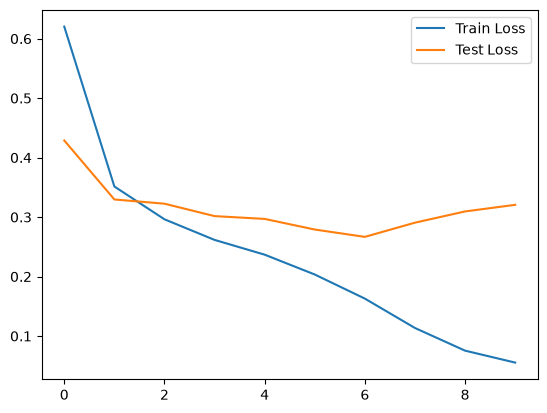

In [17]:
plt.plot(train_losses, label="Train Loss")
plt.plot(test_losses, label="Test Loss")
plt.legend()

In [36]:
def show_predictions(model, dataset, n=12):
    """
    Display n random images from a dataset with
    actual and predicted labels.
    """
    print([(i, class_label) for i, class_label in enumerate(classes)])
    model.eval()
    indices = random.sample(range(len(dataset)), n)
    cols = 8
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols,
                             figsize=(1.5 * cols, 1.5 * rows))
    axes = axes.flatten()

    with torch.no_grad():
        for ax, idx in zip(axes, indices):
            image, label = dataset[idx]
            # Add batch dimension
            logits = model(image.unsqueeze(0))
            probabilities = torch.softmax(logits, dim=1)
            confidence = probabilities.max().item() * 100
            prediction = logits.argmax(dim=1).item()
            ax.imshow(image.squeeze(), cmap="gray")
            colour = "green" if prediction == label else "red"
            # print probabilities if prediction is incorrect
            if prediction != label:
                print(f"Image index: {idx}")
                print(f"Actual: {classes[label]}")
                print(f"Predicted: {classes[prediction]}")
                print(f"Confidence: {confidence:.2f}%")
                # probabilities of the predicted class, and the actual class
                print(f" probability of predicted class: {probabilities[0, prediction].item():.2f}")
                print(f" probability of actual class: {probabilities[0, label].item():.2f}")
                print(f"Probabilities: {[f'{p*100:.2f}%' for p in probabilities.squeeze().tolist()]}")
            ax.set_title(
                f"Actual: {classes[label]}\n"
                f"Pred: {classes[prediction]}\n"
                f"Conf: {confidence:.2f}%",
                color=colour,
                fontsize=10,
            )
            ax.axis("off")

    # Hide unused axes
    for ax in axes[n:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

[(0, 'T-shirt'), (1, 'Trouser'), (2, 'Pullover'), (3, 'Dress'), (4, 'Coat'), (5, 'Sandal'), (6, 'Shirt'), (7, 'Sneaker'), (8, 'Bag'), (9, 'Ankle boot')]
Image index: 7188
Actual: Shirt
Predicted: Coat
Confidence: 96.90%
 probability of predicted class: 0.97
 probability of actual class: 0.02
Probabilities: ['0.00%', '0.00%', '1.37%', '0.00%', '96.90%', '0.00%', '1.72%', '0.00%', '0.00%', '0.00%']
Image index: 3045
Actual: Shirt
Predicted: Dress
Confidence: 51.34%
 probability of predicted class: 0.51
 probability of actual class: 0.11
Probabilities: ['0.24%', '37.03%', '0.06%', '51.34%', '0.29%', '0.00%', '10.80%', '0.06%', '0.00%', '0.18%']
Image index: 1970
Actual: T-shirt
Predicted: Shirt
Confidence: 61.03%
 probability of predicted class: 0.61
 probability of actual class: 0.39
Probabilities: ['38.97%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%', '61.03%', '0.00%', '0.00%', '0.00%']
Image index: 2397
Actual: Shirt
Predicted: T-shirt
Confidence: 84.91%
 probability of predicted cla

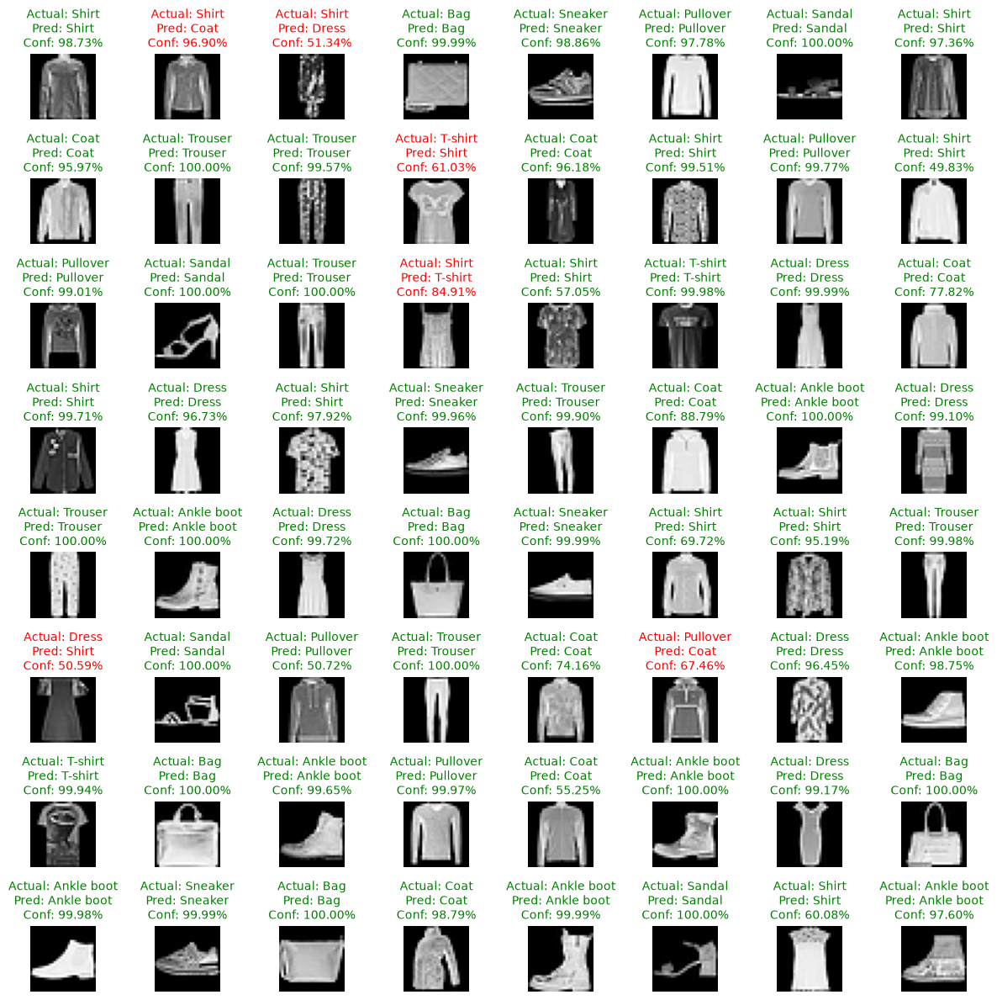

In [41]:
show_predictions(model, test_dataset, n=64)